<h1 style="text-align: center;">Deep Learning<br><br>Session - 3<br><br>Regression with ANN<br><br>KC House Data<br><h1>

# Keras Regression

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings

warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10, 6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
# !pip install folium 

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
# df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [5]:
# from matplotlib import style
# style.use('dark_background')

In [6]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [7]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.

We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [9]:
df.isnull().sum().any()

False

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### İd_number

In [11]:
df = df.drop('id', axis=1)

### price

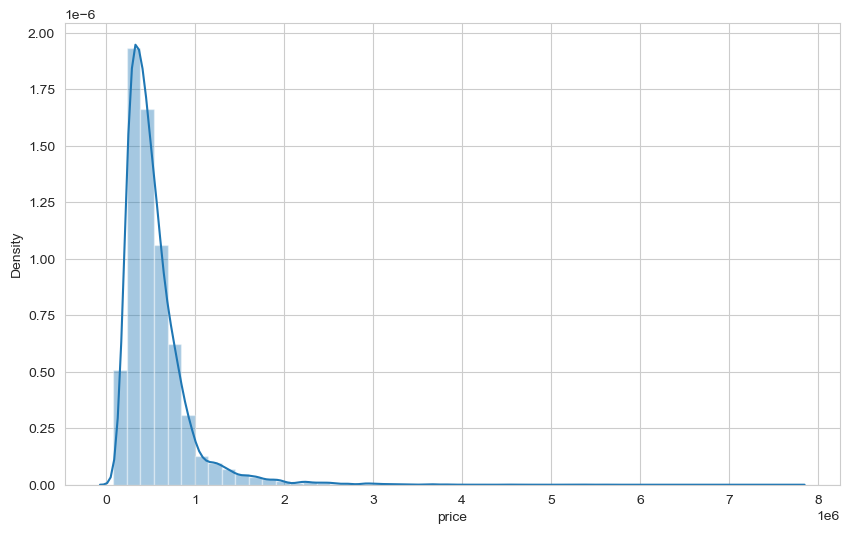

In [12]:
sns.distplot(df['price']);

In [13]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


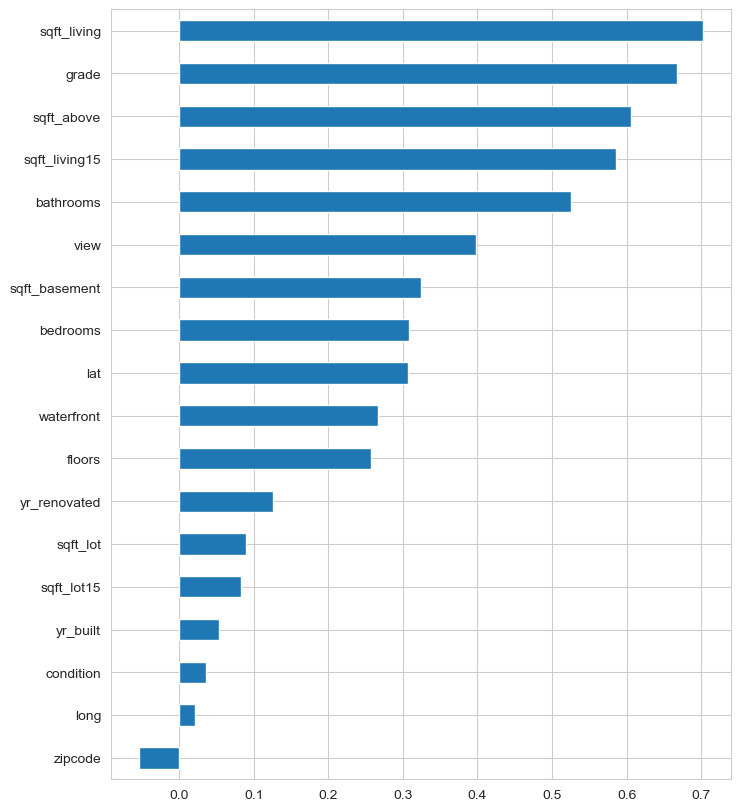

In [14]:
plt.figure(figsize=(8, 10))
df.corr()["price"].sort_values().drop("price").plot(kind="barh")

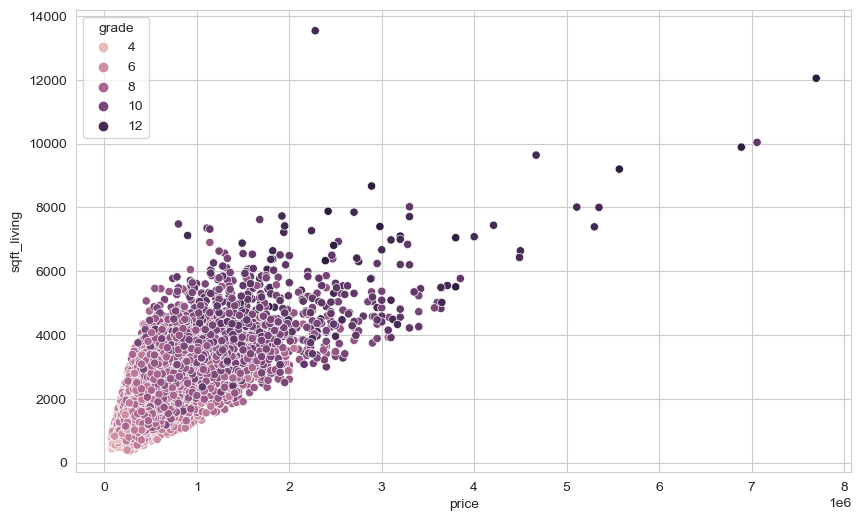

In [15]:
sns.scatterplot(x='price', y='sqft_living', data=df, hue="grade");

### bedrooms

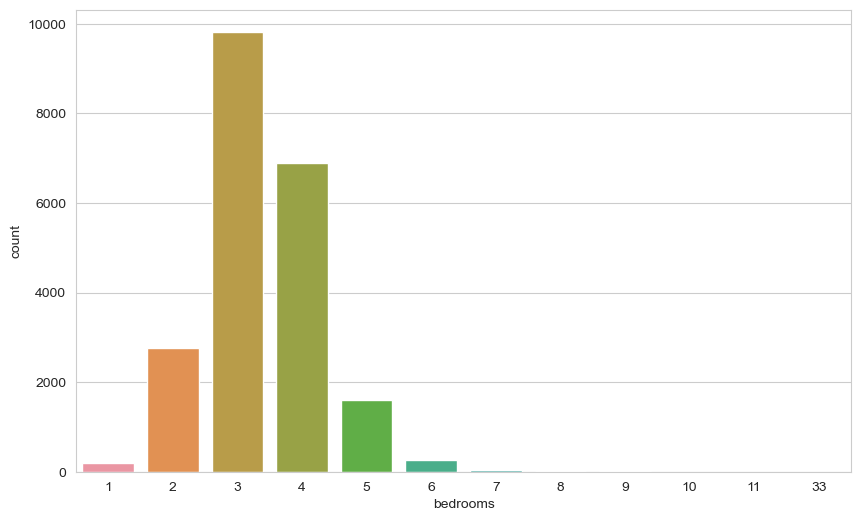

In [16]:
sns.countplot(df['bedrooms']);

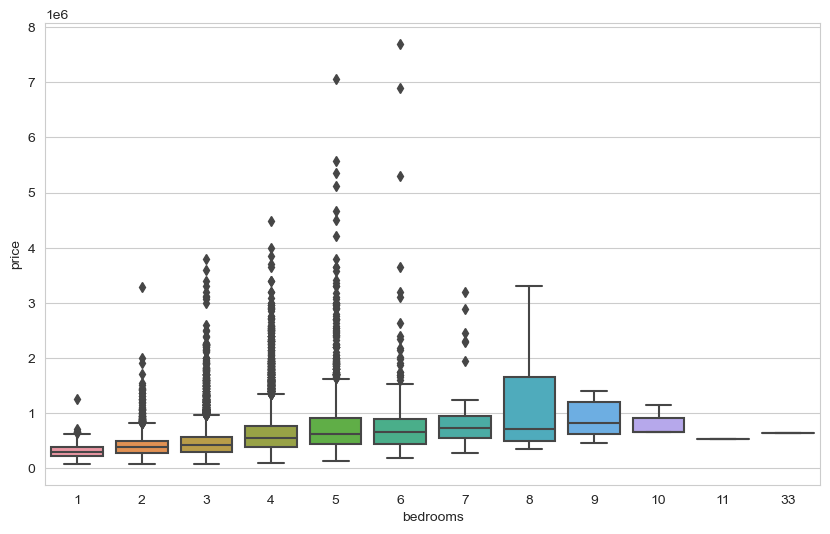

In [17]:
sns.boxplot(x='bedrooms', y='price', data=df);

In [18]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [19]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [20]:
df.shape

(21596, 20)

### date

In [21]:
df['date'].dtype

dtype('O')

In [22]:
df['date'] = pd.to_datetime(df['date'])

In [23]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [24]:
df['year'] = df['date'].dt.year
# df['year'] = df['date'].apply(lambda date : date.year)

In [25]:
df['month'] = df['date'].dt.month

In [26]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


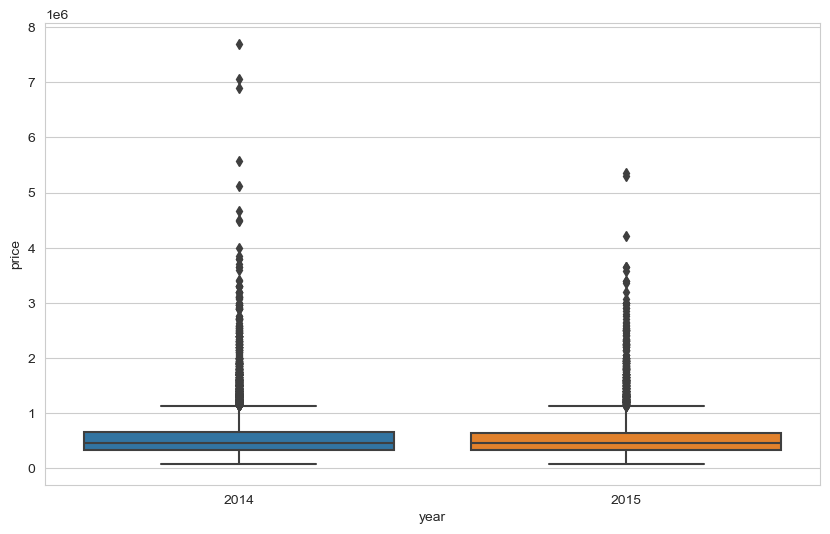

In [27]:
sns.boxplot(x='year', y='price', data=df);

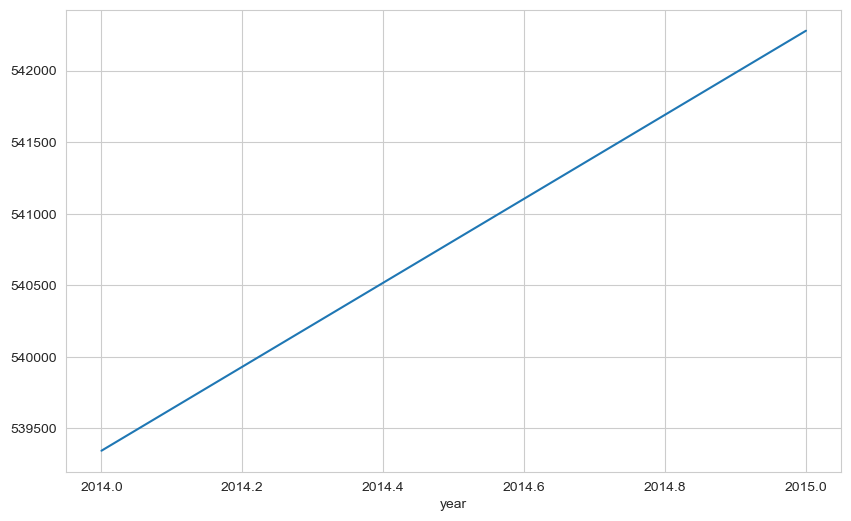

In [28]:
df.groupby('year')['price'].mean().plot();

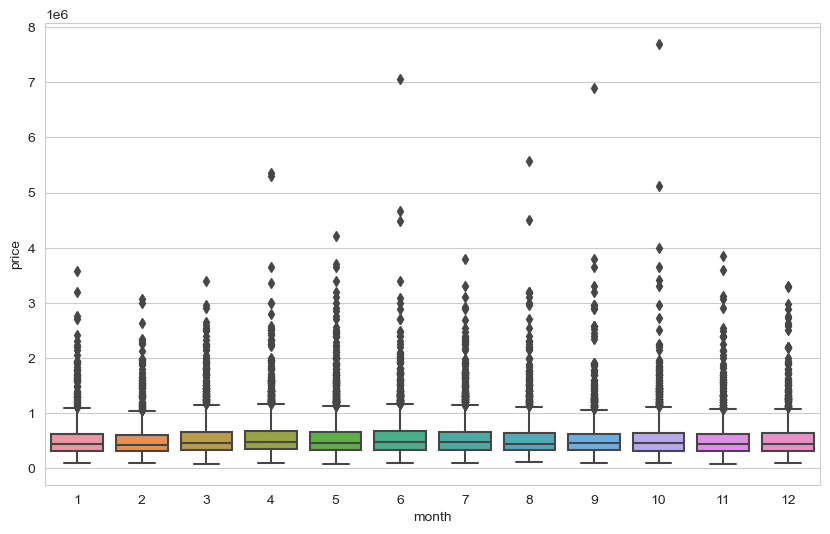

In [29]:
sns.boxplot(x='month', y='price', data=df);

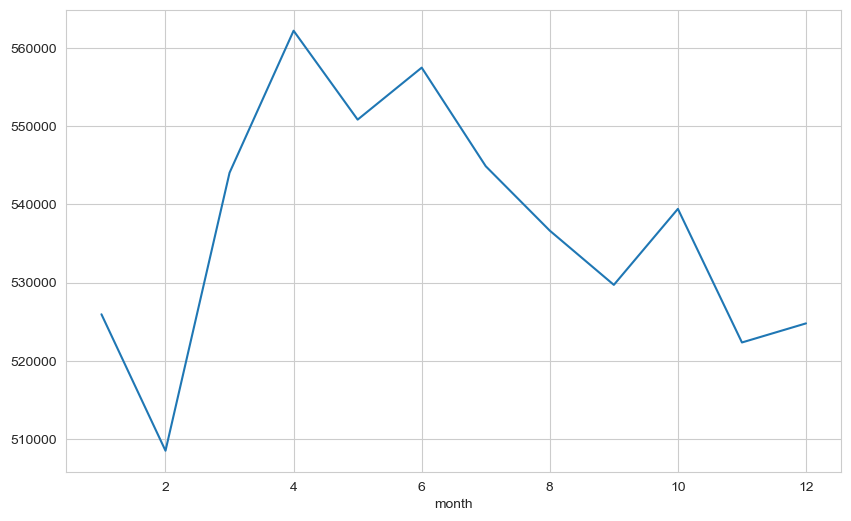

In [30]:
df.groupby('month')['price'].mean().plot();

In [31]:
# month_dummy = pd.get_dummies(df["month"], prefix="month")
# df = pd.concat([df, month_dummy], axis=1)
# df.head()

In [32]:
df = df.drop(['date', "year", "month"], axis=1)

### zipcode

In [33]:
df['zipcode'].value_counts(dropna=False)

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [34]:
df = df.drop('zipcode', axis=1)

### yr_renovated & yr_built

In [35]:
df['yr_renovated'].value_counts(dropna=False)

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

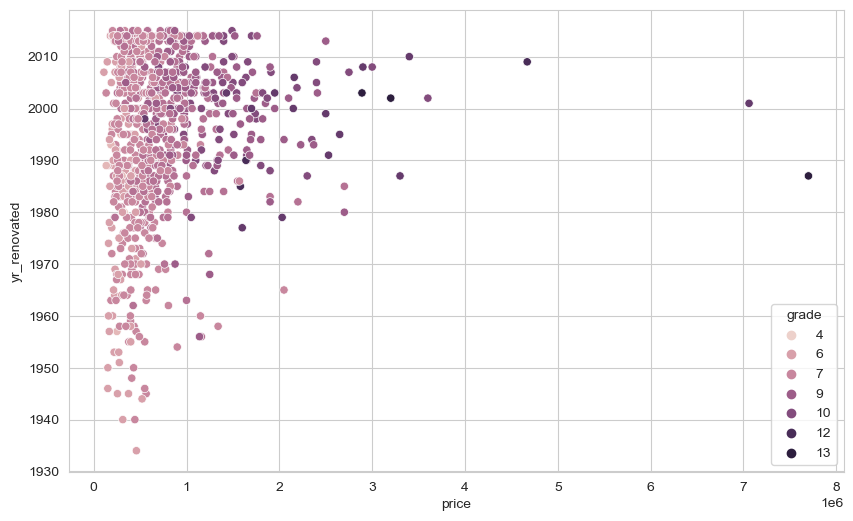

In [36]:
sns.scatterplot(x='price',
                y='yr_renovated',
                data=df[df.yr_renovated != 0],
                hue="grade");

In [37]:
df['yr_built'].value_counts(dropna=False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

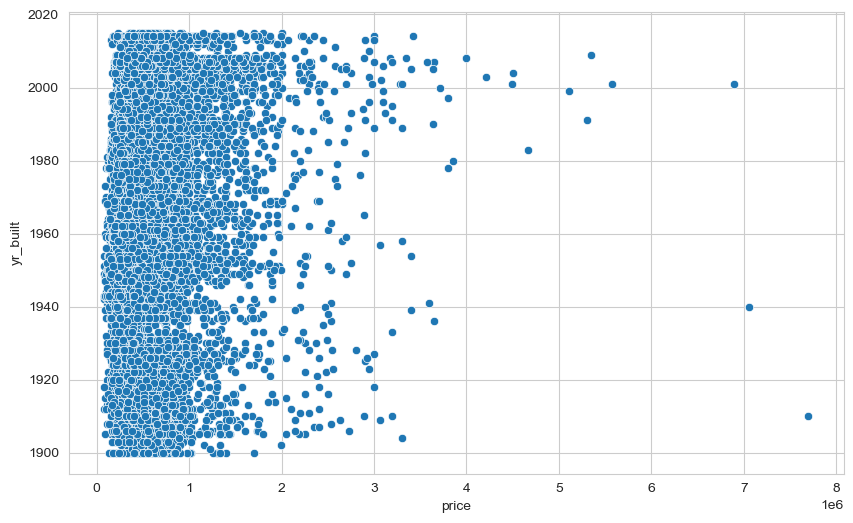

In [38]:
sns.scatterplot(x='price', y='yr_built', data=df);

In [39]:
df.yr_renovated.apply(lambda x: x if x == 0 else 1).value_counts()

0    20682
1      914
Name: yr_renovated, dtype: int64

In [40]:
df["renovated"] = df.yr_renovated.apply(lambda x : x if x == 0 else 1)

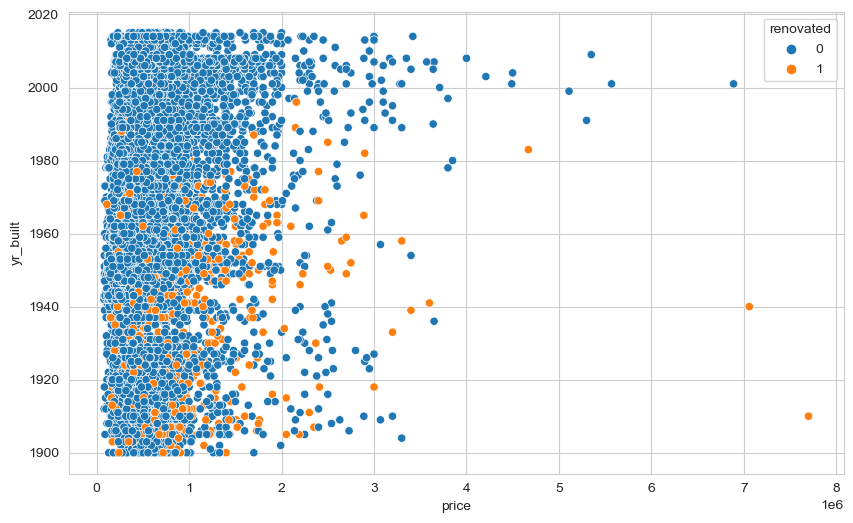

In [41]:
sns.scatterplot(x='price', y='yr_built', data=df, hue="renovated");

In [42]:
df["built|renovated"] = df["yr_renovated"].replace(0, np.nan).fillna(df["yr_built"])
df["built|renovated"]

0       1955.000
1       1991.000
2       1933.000
3       1965.000
4       1987.000
          ...   
21592   2009.000
21593   2014.000
21594   2009.000
21595   2004.000
21596   2008.000
Name: built|renovated, Length: 21596, dtype: float64

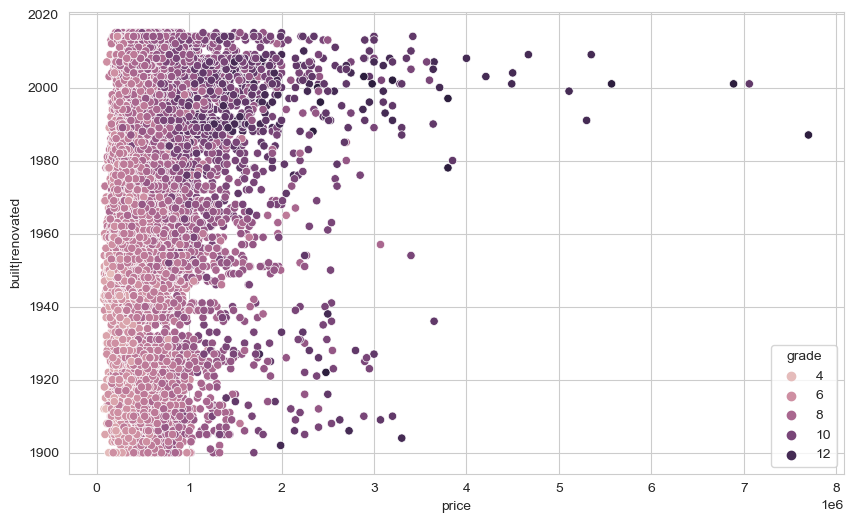

In [43]:
sns.scatterplot(x='price', y='built|renovated', data=df, hue="grade");

In [44]:
df.drop(["yr_renovated", "yr_built", "renovated"], axis=1, inplace=True)
# df.drop(["built|renovated", "renovated"], axis=1, inplace=True)

could make sense due to scaling, higher should correlate to more value

### sqft_basement

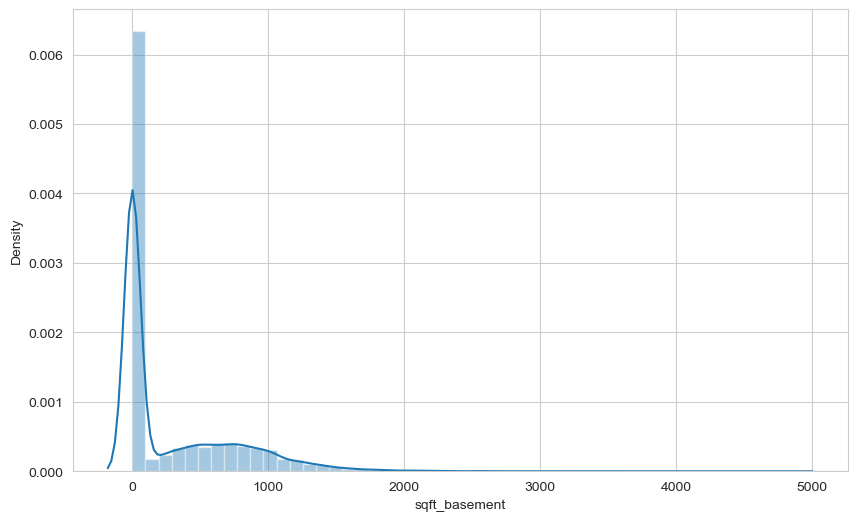

In [45]:
sns.distplot(df['sqft_basement']);

In [46]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,2009.000
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,1991.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,1980.000


could make sense due to scaling, higher should correlate to more value

### sqft_above

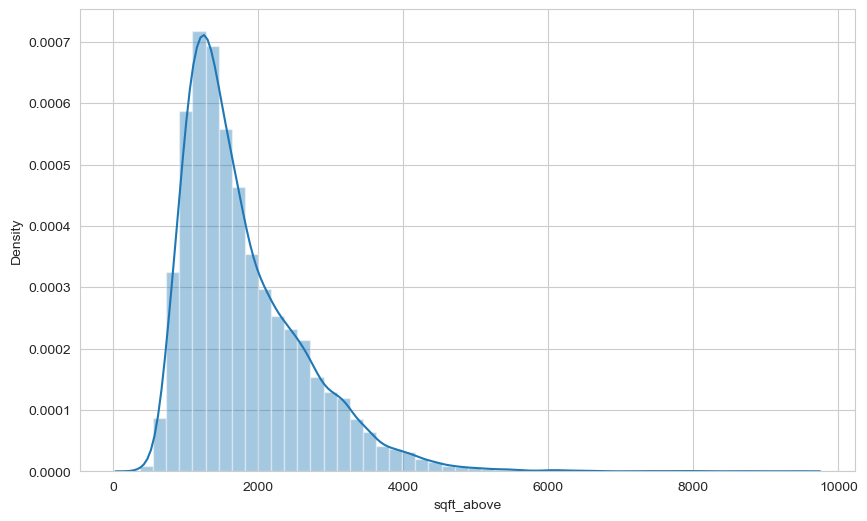

In [47]:
sns.distplot(df['sqft_above']);

In [48]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,47.568,-122.189,4160,18969,2001.000
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,47.733,-122.362,2740,10761,1996.000
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,47.541,-121.982,6210,95832,2006.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,47.455,-121.764,5610,169549,2002.000
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,47.447,-122.086,3270,34500,1992.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000


### Geographical Properties

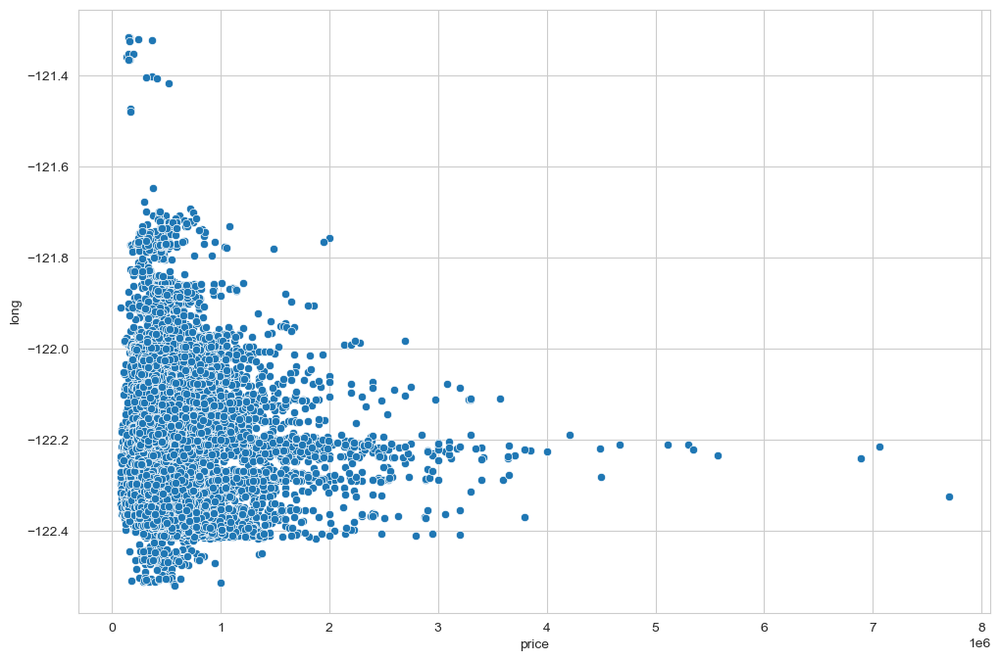

In [49]:
plt.figure(figsize=(12, 8))

sns.scatterplot(x='price', y='long', data=df);

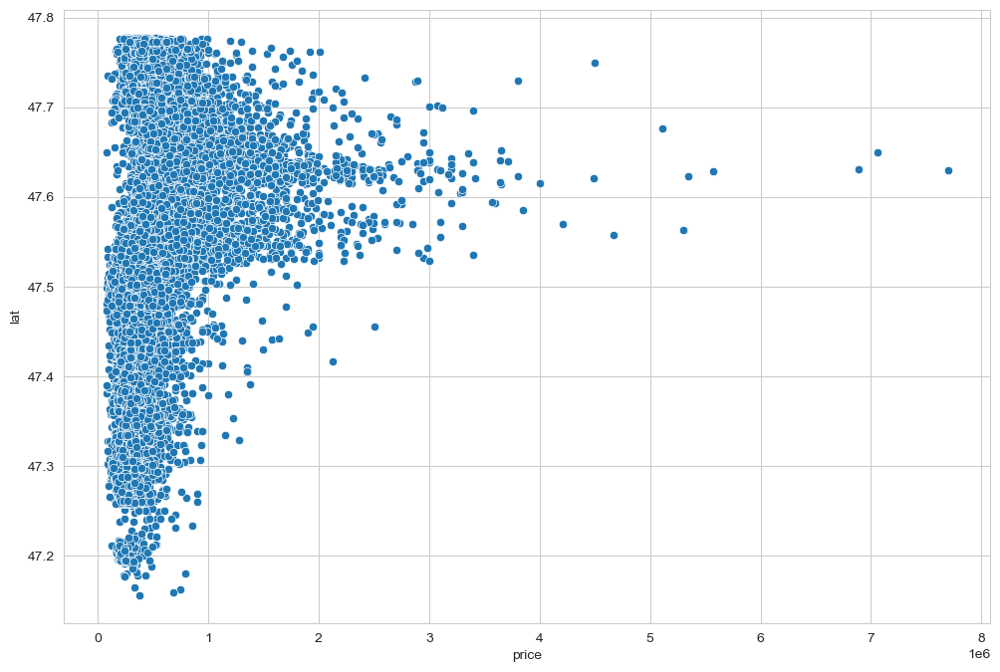

In [50]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='price', y='lat', data=df);

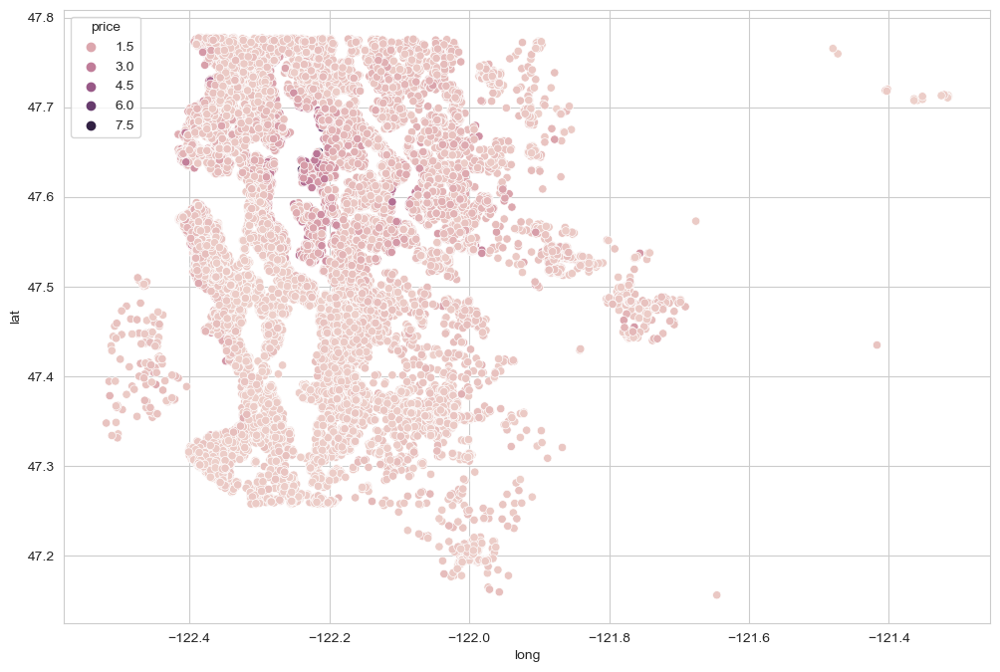

In [51]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='long', y='lat', data=df, hue='price');

In [52]:
len(df) * (0.01)

215.96

In [53]:
df.sort_values('price', ascending=False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,2001.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,2007.000
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,1990.000
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,2007.000
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,47.620,-122.212,2370,13320,1951.000


In [54]:
non_top_1_perc = df.sort_values('price', ascending=False).iloc[216:]

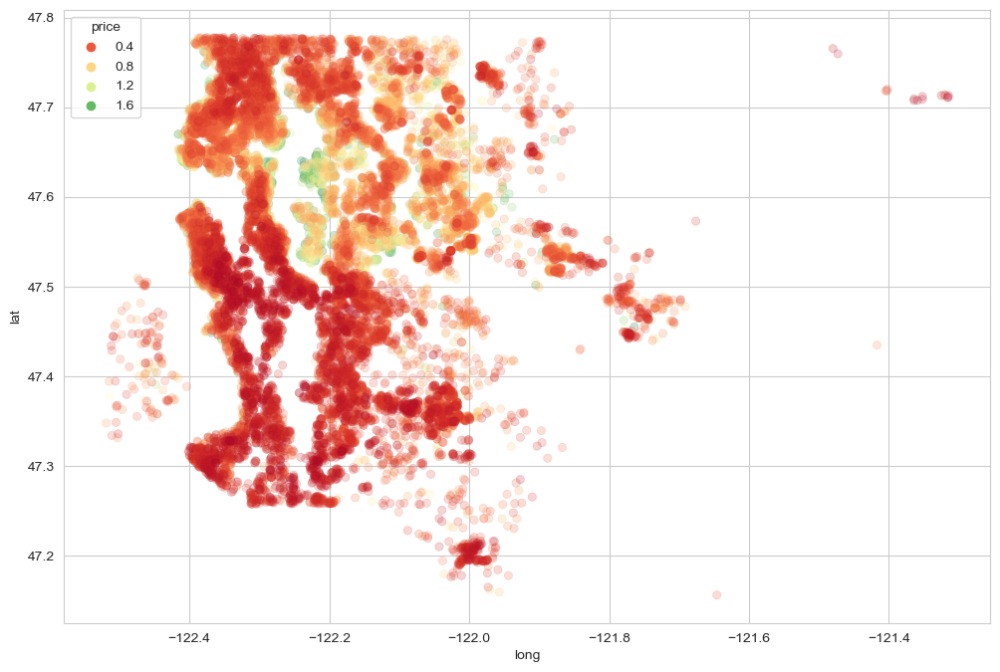

In [55]:
plt.figure(figsize=(12, 8))

sns.scatterplot(x='long',
                y='lat',
                data=non_top_1_perc,
                hue='price',
                palette='RdYlGn',
                edgecolor=None,
                alpha=0.2);

In [56]:
import folium
import branca.colormap as cm

In [57]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [58]:
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [59]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

colormap = cm.StepColormap(colors=["red", "orange", "yellow", "green"],
                           index=[step_1, step_2, step_3, step_4, step_5],
                           vmin=step_1,
                           vmax=step_5)

for loc, p in zip(zip(df['lat'], df['long']), df["price"]):
    folium.Circle(location=loc, radius=1, fill=True,
                  color=colormap(p)).add_to(m)
m

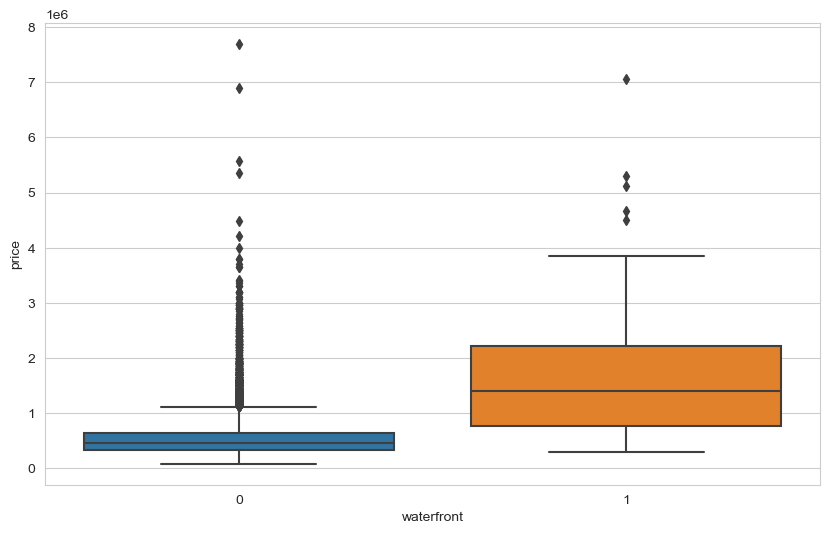

In [60]:
sns.boxplot(x='waterfront', y='price', data=df);

In [61]:
df.groupby("waterfront").price.mean()

waterfront
0    531757.274
1   1662524.184
Name: price, dtype: float64

### latest data

In [62]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,1987.000


In [63]:
df.shape

(21596, 17)

## Preprocessing of Data
- Train | Test Split, Scalling

In [64]:
from sklearn.model_selection import train_test_split

In [65]:
X = df.drop('price', axis=1)
y = df['price']

In [66]:
seed = 101

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.1,
                                                    random_state=seed)

In [68]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [69]:
scaler = MinMaxScaler()

In [70]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [71]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [72]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [73]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [74]:
X_train.shape

(19436, 16)

In [75]:
tf.random.set_seed(seed)

# tf.keras.backend.clear_session()

model = Sequential()

model.add(Dense(24, activation='relu', input_dim=X_train.shape[1])) # 150% of features(24) is good to go for initial
# model.add(Activation("relu")) # Activation function can be added separately as a different line after each layer.
model.add(Dense(24, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(6, activation='relu'))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mse')

In [76]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 24)                408       
                                                                 
 dense_1 (Dense)             (None, 24)                600       
                                                                 
 dense_2 (Dense)             (None, 12)                300       
                                                                 
 dense_3 (Dense)             (None, 6)                 78        
                                                                 
 dense_4 (Dense)             (None, 1)                 7         
                                                                 
Total params: 1,393
Trainable params: 1,393
Non-trainable params: 0
_________________________________________________________________


In [77]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-0.12284759, -0.10919073, -0.26669747,  0.30515635, -0.20987093,
          0.36127257, -0.16166568, -0.10487315,  0.07991821,  0.373474  ,
         -0.05052188,  0.05701876, -0.05822027,  0.3431872 , -0.11133385,
         -0.26953292, -0.22036768,  0.1461457 ,  0.32822615,  0.04218614,
          0.03000173, -0.22864191,  0.2516408 ,  0.34348327],
        [ 0.06179103,  0.06339255, -0.37597987,  0.30400383, -0.1320816 ,
          0.06914362,  0.15357411,  0.28710198,  0.08330789, -0.23766382,
         -0.12004632,  0.05375254,  0.19745457,  0.07157409,  0.25870246,
         -0.37586963, -0.34528247, -0.05893046,  0.15903926, -0.2092193 ,
         -0.31771058, -0.18499783,  0.32180625, -0.17032062],
        [ 0.22096354,  0.24158609, -0.3692033 ,  0.3528952 , -0.22572325,
         -0.06803066,  0.0430522 ,  0.24241477,  0.15368676, -0.22021468,
         -0.15650244,  0.22577554, -0.18895032, -0.37514246,  0.1166

In [78]:
model.fit(x=X_train,
          y=y_train,
          validation_split=0.15,
          batch_size=128, # A multiple of 2 is preferred
          epochs=1000)

Epoch 1/1000
130/130 [==============================] - 2s 8ms/step - loss: 428599148544.0000 - val_loss: 423925186560.0000
Epoch 2/1000
130/130 [==============================] - 1s 4ms/step - loss: 427461967872.0000 - val_loss: 420148477952.0000
Epoch 3/1000
130/130 [==============================] - 1s 4ms/step - loss: 412811067392.0000 - val_loss: 387317006336.0000
Epoch 4/1000
130/130 [==============================] - 1s 4ms/step - loss: 343098884096.0000 - val_loss: 275659915264.0000
Epoch 5/1000
130/130 [==============================] - 1s 5ms/step - loss: 199358906368.0000 - val_loss: 133044355072.0000
Epoch 6/1000
130/130 [==============================] - 1s 4ms/step - loss: 104727855104.0000 - val_loss: 100709171200.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 93011247104.0000 - val_loss: 99297878016.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 91530027008.0000 - val_loss: 97935515648.0000
Epoch 9/1000

130/130 [==============================] - 0s 2ms/step - loss: 34013097984.0000 - val_loss: 37782065152.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 34031040512.0000 - val_loss: 37649596416.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 33946093568.0000 - val_loss: 37605527552.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 33895380992.0000 - val_loss: 37477523456.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 33884516352.0000 - val_loss: 37512642560.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 33851940864.0000 - val_loss: 37586419712.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 33844455424.0000 - val_loss: 37418926080.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 33795584000.0000 - val_loss: 37356777472.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 31792463872.0000 - val_loss: 34471251968.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 31785717760.0000 - val_loss: 34466447360.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 31801360384.0000 - val_loss: 34536534016.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 31770114048.0000 - val_loss: 34306629632.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 31746168832.0000 - val_loss: 34680115200.0000
Epoch 270/1000
130/130 [==============================] - 0s 3ms/step - loss: 31770968064.0000 - val_loss: 34513211392.0000
Epoch 271/1000
130/130 [==============================] - 0s 3ms/step - loss: 31723184128.0000 - val_loss: 34326618112.0000
Epoch 272/1000
130/130 [==============================] - 0s 4ms/step - loss: 31732510720.0000 - val_loss: 34459262976.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 30689902592.0000 - val_loss: 33165215744.0000
Epoch 398/1000
130/130 [==============================] - 0s 4ms/step - loss: 30696587264.0000 - val_loss: 33159358464.0000
Epoch 399/1000
130/130 [==============================] - 0s 3ms/step - loss: 30715504640.0000 - val_loss: 33314813952.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 30727659520.0000 - val_loss: 33101729792.0000
Epoch 401/1000
130/130 [==============================] - 0s 4ms/step - loss: 30679103488.0000 - val_loss: 33055694848.0000
Epoch 402/1000
130/130 [==============================] - 0s 4ms/step - loss: 30670313472.0000 - val_loss: 33015750656.0000
Epoch 403/1000
130/130 [==============================] - 0s 3ms/step - loss: 30640175104.0000 - val_loss: 33601345536.0000
Epoch 404/1000
130/130 [==============================] - 0s 3ms/step - loss: 30671945728.0000 - val_loss: 33050753024.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 29793531904.0000 - val_loss: 31998877696.0000
Epoch 530/1000
130/130 [==============================] - 0s 2ms/step - loss: 29776293888.0000 - val_loss: 32057714688.0000
Epoch 531/1000
130/130 [==============================] - 0s 2ms/step - loss: 29772183552.0000 - val_loss: 31892273152.0000
Epoch 532/1000
130/130 [==============================] - 0s 2ms/step - loss: 29754132480.0000 - val_loss: 32091351040.0000
Epoch 533/1000
130/130 [==============================] - 0s 2ms/step - loss: 29769115648.0000 - val_loss: 31954489344.0000
Epoch 534/1000
130/130 [==============================] - 0s 2ms/step - loss: 29740982272.0000 - val_loss: 31860649984.0000
Epoch 535/1000
130/130 [==============================] - 0s 2ms/step - loss: 29744498688.0000 - val_loss: 31952455680.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 29746620416.0000 - val_loss: 31837427712.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 28789309440.0000 - val_loss: 31290451968.0000
Epoch 662/1000
130/130 [==============================] - 0s 2ms/step - loss: 28785496064.0000 - val_loss: 31157118976.0000
Epoch 663/1000
130/130 [==============================] - 0s 3ms/step - loss: 28757882880.0000 - val_loss: 31128860672.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 28760670208.0000 - val_loss: 31085879296.0000
Epoch 665/1000
130/130 [==============================] - 0s 3ms/step - loss: 28724326400.0000 - val_loss: 31367591936.0000
Epoch 666/1000
130/130 [==============================] - 0s 3ms/step - loss: 28784644096.0000 - val_loss: 31163062272.0000
Epoch 667/1000
130/130 [==============================] - 0s 3ms/step - loss: 28743311360.0000 - val_loss: 31049480192.0000
Epoch 668/1000
130/130 [==============================] - 0s 3ms/step - loss: 28736202752.0000 - val_loss: 31195029504.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 27952340992.0000 - val_loss: 30994319360.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 27932004352.0000 - val_loss: 30751690752.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 27951368192.0000 - val_loss: 30814369792.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 27972251648.0000 - val_loss: 30760427520.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 27931766784.0000 - val_loss: 30897889280.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 27937933312.0000 - val_loss: 30699511808.0000
Epoch 799/1000
130/130 [==============================] - 0s 3ms/step - loss: 27969675264.0000 - val_loss: 30838042624.0000
Epoch 800/1000
130/130 [==============================] - 0s 3ms/step - loss: 27946799104.0000 - val_loss: 30949036032.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 27524612096.0000 - val_loss: 30716280832.0000
Epoch 926/1000
130/130 [==============================] - 0s 3ms/step - loss: 27516547072.0000 - val_loss: 30740973568.0000
Epoch 927/1000
130/130 [==============================] - 0s 3ms/step - loss: 27520702464.0000 - val_loss: 30958833664.0000
Epoch 928/1000
130/130 [==============================] - 0s 4ms/step - loss: 27502213120.0000 - val_loss: 30913826816.0000
Epoch 929/1000
130/130 [==============================] - 0s 3ms/step - loss: 27510224896.0000 - val_loss: 30837581824.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 27508746240.0000 - val_loss: 30829451264.0000
Epoch 931/1000
130/130 [==============================] - 0s 3ms/step - loss: 27494989824.0000 - val_loss: 30685366272.0000
Epoch 932/1000
130/130 [==============================] - 0s 4ms/step - loss: 27497938944.0000 - val_loss: 30660077568.0000
Epoch 933/1000
130/130 

In [79]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-1.22847587e-01,  1.75096169e-01,  3.68090868e-01,
         -1.75854474e-01, -6.27353013e-01,  1.31999826e+00,
         -5.71338952e-01, -8.11585248e-01, -2.96440750e-01,
         -1.64847660e+00, -7.37641513e-01, -5.71452320e-01,
         -5.06213546e-01, -1.19611293e-01, -5.38940609e-01,
         -1.36017919e+00, -2.41542593e-01, -2.31687590e-01,
         -3.51657793e-02, -3.49776804e-01,  6.34058611e-03,
         -1.78641513e-01,  2.45290145e-01, -5.64860292e-02],
        [ 6.17910326e-02,  1.06909239e+00, -4.50048417e-01,
          6.36450887e-01,  2.41508931e-01,  2.21196353e-01,
          5.35988629e-01,  1.85736549e+00,  4.63987440e-01,
          1.22932649e+00,  5.03396273e-01,  5.99157095e-01,
          2.11112666e+00,  4.15231377e-01,  6.07962251e-01,
          1.24031925e+00, -3.66513729e-01,  3.12517077e-01,
          5.20552814e-01,  2.15143299e+00, -3.41415912e-01,
          1.37047589e+00,  3.52

In [80]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,428599148544.000,423925186560.000
1,427461967872.000,420148477952.000
2,412811067392.000,387317006336.000
3,343098884096.000,275659915264.000
4,199358906368.000,133044355072.000
...,...,...
995,27363375104.000,30646884352.000
996,27363250176.000,30704134144.000
997,27356223488.000,30712195072.000
998,27335395328.000,30735374336.000


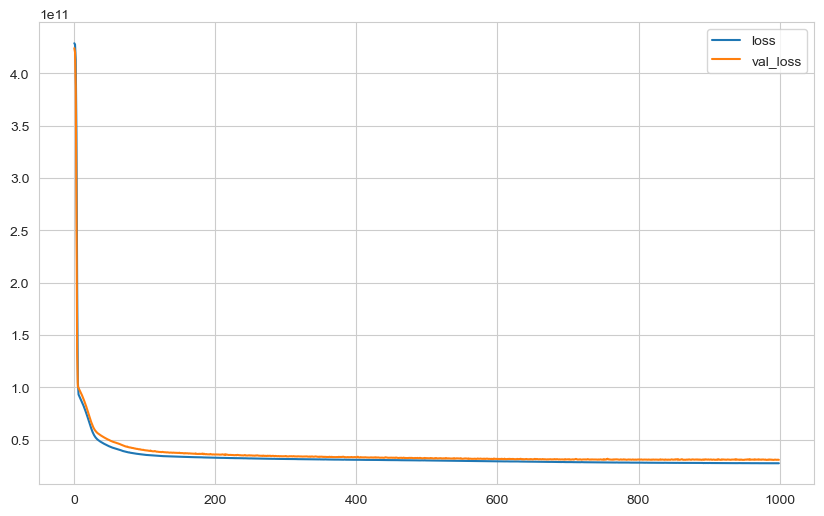

In [81]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [82]:
model.evaluate(X_test, y_test, verbose=0)

24949766144.0

In [83]:
y_pred = model.predict(X_test)

68/68 [==============================] - 1s 3ms/step


In [84]:
eval_metric(y_test, y_pred)

r2_score: 0.8058077590650672 
mae: 96988.46521267362 
mse: 24949772885.3609 
rmse: 157954.9710688489


### learning_rate

In [85]:
from tensorflow.keras.optimizers import Adam

In [86]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation='relu', input_dim=X_train.shape[1]))
model.add(Dense(24, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(6, activation='relu'))
model.add(Dense(1))

opt = Adam(lr=0.003)  # default learning rate value is 0.001
model.compile(optimizer=opt, loss='mse')

In [87]:
model.weights

[<tf.Variable 'dense_5/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-0.37580112, -0.05661163,  0.3143351 ,  0.2051403 ,  0.01957321,
         -0.17240563, -0.07603914,  0.10443214, -0.03180742, -0.20810625,
          0.15623337,  0.25654173,  0.01834667, -0.21641742, -0.07893038,
         -0.29814243,  0.1964606 , -0.35309935,  0.28223658, -0.19889191,
          0.05686012, -0.36536226,  0.07719764,  0.3689677 ],
        [ 0.03737167,  0.27914965,  0.27839416,  0.12197179, -0.02125269,
          0.3049255 ,  0.19147015, -0.27193585, -0.22474179, -0.16933286,
          0.05524048,  0.0492498 ,  0.20541835,  0.21684438, -0.03226495,
         -0.18176559, -0.3848259 , -0.16471379,  0.03857717, -0.3391037 ,
         -0.2880602 , -0.30006033, -0.03718597, -0.26063687],
        [ 0.2572518 , -0.162685  , -0.14990777, -0.10479769,  0.07720593,
          0.02623475,  0.05783191, -0.07266885, -0.1938416 ,  0.3852229 ,
         -0.3538015 ,  0.36317003, -0.3699538 , -0.25858307,  0.09

In [88]:
model.fit(x=X_train,
          y=y_train,
          validation_split=0.15,
          batch_size=128,
          epochs=1000)

Epoch 1/1000
130/130 [==============================] - 2s 5ms/step - loss: 428437143552.0000 - val_loss: 422744096768.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 408585404416.0000 - val_loss: 356343250944.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 231356284928.0000 - val_loss: 113274331136.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 95112888320.0000 - val_loss: 99262259200.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 90873618432.0000 - val_loss: 96684998656.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 88115003392.0000 - val_loss: 93805289472.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 85310267392.0000 - val_loss: 91161624576.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 82371952640.0000 - val_loss: 88018698240.0000
Epoch 9/1000
130/1

130/130 [==============================] - 0s 3ms/step - loss: 32042874880.0000 - val_loss: 34713370624.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 32052244480.0000 - val_loss: 34635546624.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 31965861888.0000 - val_loss: 34628194304.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 31886905344.0000 - val_loss: 34495238144.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 31892086784.0000 - val_loss: 34522378240.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 31832336384.0000 - val_loss: 34937491456.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 31879532544.0000 - val_loss: 34506227712.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 31780411392.0000 - val_loss: 34495438848.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 29844705280.0000 - val_loss: 32015357952.0000
Epoch 266/1000
130/130 [==============================] - 0s 3ms/step - loss: 29834174464.0000 - val_loss: 31902795776.0000
Epoch 267/1000
130/130 [==============================] - 0s 3ms/step - loss: 29878505472.0000 - val_loss: 31943946240.0000
Epoch 268/1000
130/130 [==============================] - 0s 3ms/step - loss: 29815193600.0000 - val_loss: 31675312128.0000
Epoch 269/1000
130/130 [==============================] - 0s 3ms/step - loss: 29746341888.0000 - val_loss: 32242135040.0000
Epoch 270/1000
130/130 [==============================] - 0s 3ms/step - loss: 29826117632.0000 - val_loss: 32050169856.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 29727406080.0000 - val_loss: 31673145344.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 29799393280.0000 - val_loss: 31799420928.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 27962355712.0000 - val_loss: 31117498368.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 28008046592.0000 - val_loss: 30601377792.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 28010350592.0000 - val_loss: 31490668544.0000
Epoch 400/1000
130/130 [==============================] - 0s 2ms/step - loss: 28075679744.0000 - val_loss: 30602659840.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 27989397504.0000 - val_loss: 30568611840.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 27949068288.0000 - val_loss: 30499989504.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 27892156416.0000 - val_loss: 31199531008.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 27950589952.0000 - val_loss: 30489649152.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 27090401280.0000 - val_loss: 30734596096.0000
Epoch 530/1000
130/130 [==============================] - 0s 3ms/step - loss: 27059095552.0000 - val_loss: 30800664576.0000
Epoch 531/1000
130/130 [==============================] - 0s 3ms/step - loss: 27058464768.0000 - val_loss: 30510276608.0000
Epoch 532/1000
130/130 [==============================] - 0s 3ms/step - loss: 27042373632.0000 - val_loss: 30890123264.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 27074373632.0000 - val_loss: 30455746560.0000
Epoch 534/1000
130/130 [==============================] - 0s 3ms/step - loss: 27063578624.0000 - val_loss: 30481309696.0000
Epoch 535/1000
130/130 [==============================] - 0s 2ms/step - loss: 27061360640.0000 - val_loss: 30828011520.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 27102552064.0000 - val_loss: 30513989632.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26751035392.0000 - val_loss: 30395895808.0000
Epoch 662/1000
130/130 [==============================] - 0s 3ms/step - loss: 26742962176.0000 - val_loss: 30397771776.0000
Epoch 663/1000
130/130 [==============================] - 0s 3ms/step - loss: 26682206208.0000 - val_loss: 30583142400.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 26715779072.0000 - val_loss: 30272081920.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 26712334336.0000 - val_loss: 30836574208.0000
Epoch 666/1000
130/130 [==============================] - 0s 3ms/step - loss: 26784229376.0000 - val_loss: 30528307200.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 26739382272.0000 - val_loss: 30488905728.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 26740645888.0000 - val_loss: 30656049152.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26473945088.0000 - val_loss: 30978277376.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 26434281472.0000 - val_loss: 30501496832.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 26438916096.0000 - val_loss: 30663766016.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 26459258880.0000 - val_loss: 30529415168.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 26445045760.0000 - val_loss: 30685007872.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 26476806144.0000 - val_loss: 30449367040.0000
Epoch 799/1000
130/130 [==============================] - 0s 2ms/step - loss: 26467801088.0000 - val_loss: 30695979008.0000
Epoch 800/1000
130/130 [==============================] - 0s 3ms/step - loss: 26487713792.0000 - val_loss: 30994051072.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 26234077184.0000 - val_loss: 30730106880.0000
Epoch 926/1000
130/130 [==============================] - 0s 2ms/step - loss: 26247897088.0000 - val_loss: 30795233280.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 26247272448.0000 - val_loss: 31011098624.0000
Epoch 928/1000
130/130 [==============================] - 0s 3ms/step - loss: 26212601856.0000 - val_loss: 31039909888.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 26241652736.0000 - val_loss: 30884698112.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 26210938880.0000 - val_loss: 30997796864.0000
Epoch 931/1000
130/130 [==============================] - 0s 3ms/step - loss: 26203017216.0000 - val_loss: 30717118464.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 26254905344.0000 - val_loss: 30742632448.0000
Epoch 933/1000
130/130 

<AxesSubplot:>

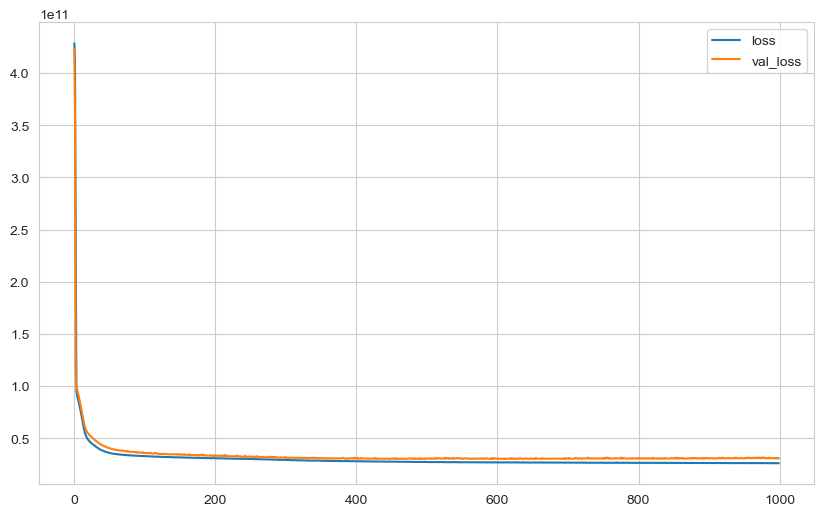

In [89]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [90]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [91]:
eval_metric(y_test, y_pred)

r2_score: 0.8216845235094059 
mae: 93802.45118634259 
mse: 22909929969.22014 
rmse: 151360.26549005567


### EarlyStopping

In [92]:
from tensorflow.keras.callbacks import EarlyStopping

In [93]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation='relu', input_dim=X_train.shape[1]))
model.add(Dense(24, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(6, activation='relu'))
model.add(Dense(1))

opt = Adam(lr=0.003)
model.compile(optimizer=opt, loss='mse')

In [94]:
early_stop = EarlyStopping(monitor="val_loss",
                           mode="min",
                           verbose=1,
                           patience=25,
                           restore_best_weights=True)

In [95]:
model.fit(x=X_train,
          y=y_train,
          validation_split=0.15,
          batch_size=128,
          epochs=1000,
          callbacks=[early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 427812749312.0000 - val_loss: 418533507072.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 353531527168.0000 - val_loss: 202171121664.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 111884337152.0000 - val_loss: 99339239424.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 90422910976.0000 - val_loss: 95626387456.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 86565044224.0000 - val_loss: 91773698048.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 82458443776.0000 - val_loss: 87430414336.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 78086225920.0000 - val_loss: 83096600576.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 73402966016.0000 - val_loss: 78106845184.0000
Epoch 9/1000
130/13

130/130 [==============================] - 0s 3ms/step - loss: 31235753984.0000 - val_loss: 33564674048.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 31229163520.0000 - val_loss: 33555322880.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 31171645440.0000 - val_loss: 33490130944.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 31089741824.0000 - val_loss: 33366974464.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 31070124032.0000 - val_loss: 33438212096.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 31013478400.0000 - val_loss: 33980780544.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 31089860608.0000 - val_loss: 33513830400.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 30972071936.0000 - val_loss: 33495568384.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 28608794624.0000 - val_loss: 30924525568.0000
Epoch 266/1000
130/130 [==============================] - 0s 3ms/step - loss: 28610908160.0000 - val_loss: 30882625536.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 28649713664.0000 - val_loss: 30739023872.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 28596074496.0000 - val_loss: 30528634880.0000
Epoch 269/1000
130/130 [==============================] - 0s 3ms/step - loss: 28526544896.0000 - val_loss: 31331436544.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 28627869696.0000 - val_loss: 31075760128.0000
Epoch 271/1000
130/130 [==============================] - 0s 3ms/step - loss: 28512802816.0000 - val_loss: 30591809536.0000
Epoch 272/1000
130/130 [==============================] - 1s 4ms/step - loss: 28616591360.0000 - val_loss: 30816065536.0000
Epoch 273/1000
130/130 

<AxesSubplot:>

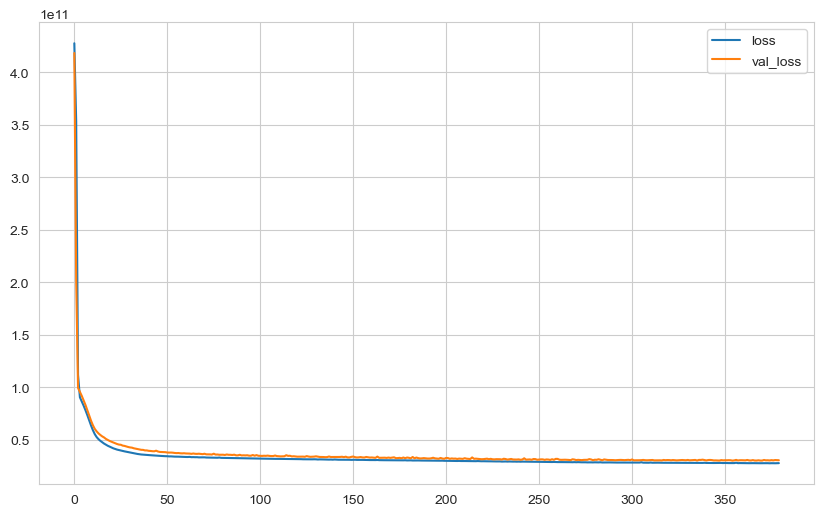

In [96]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [97]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [98]:
eval_metric(y_test, y_pred)

r2_score: 0.8059516037032088 
mae: 97409.92550636575 
mse: 24931291760.496525 
rmse: 157896.45898656666


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Dropout refers to ignoring units (i.e. neurons) during the training phase of certain set of neurons which is chosen at random. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

For each hidden layer, for each training sample, for each iteration, ignore (zero out) a random fraction, p, of nodes (and corresponding activations).

![dropout.PNG](https://miro.medium.com/max/1400/1*nty4xtm9UBuWLqxHVaamjw.png)
[Source-1](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)
[Source-2](https://medium.com/unpackai/introduction-of-dropout-and-ensemble-model-in-the-history-of-deep-learning-a4c2a512dcca)

In [99]:
from tensorflow.keras.layers import Dropout

In [100]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation='relu', input_dim=X_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(24, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(12, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(6, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr=0.003)
model.compile(optimizer=opt, loss='mse')

In [101]:
early_stop = EarlyStopping(monitor="val_loss",
                           mode="min",
                           verbose=1,
                           patience=25,
                           restore_best_weights=True)

In [102]:
model.fit(x=X_train,
          y=y_train,
          validation_split=0.15,
          batch_size=128,
          epochs=1000,
          callbacks=[early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 425770647552.0000 - val_loss: 402339266560.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 245544534016.0000 - val_loss: 103067279360.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 122072039424.0000 - val_loss: 98157043712.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 116723269632.0000 - val_loss: 92587139072.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 113886371840.0000 - val_loss: 86358515712.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 106856325120.0000 - val_loss: 80688078848.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 100765212672.0000 - val_loss: 74004094976.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 96828342272.0000 - val_loss: 68459589632.0000
Epoch 9/1000
13

130/130 [==============================] - 0s 3ms/step - loss: 71838187520.0000 - val_loss: 37577084928.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 68547399680.0000 - val_loss: 36427513856.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 65353596928.0000 - val_loss: 35517440000.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 67136495616.0000 - val_loss: 36654858240.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 65000210432.0000 - val_loss: 35578957824.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 66026827776.0000 - val_loss: 35175092224.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 63730139136.0000 - val_loss: 34666897408.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 66623836160.0000 - val_loss: 38728224768.0000
Epoch 141/1000
130/130 

<AxesSubplot:>

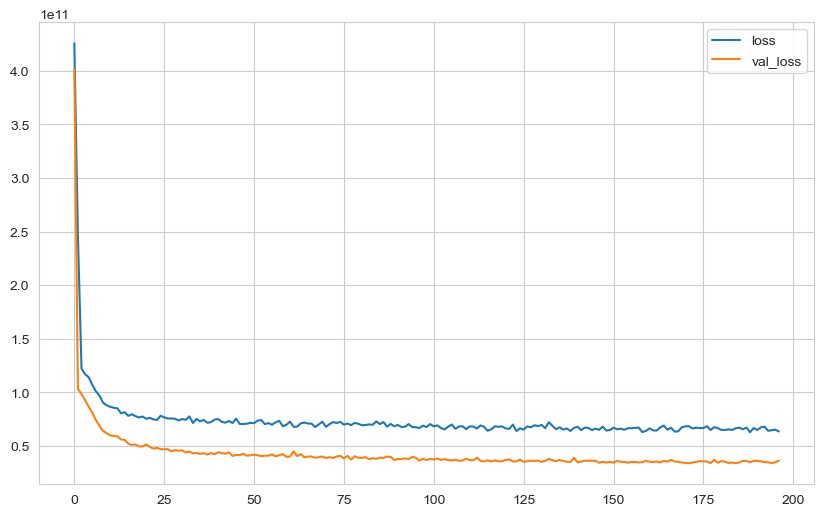

In [103]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [104]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [105]:
eval_metric(y_test, y_pred)

r2_score: 0.7825946320149151 
mae: 103664.7031177662 
mse: 27932189922.581158 
rmse: 167129.2611201915


## Saving Final Model and Scaler

In [106]:
import pickle

pickle.dump(scaler, open("scaler_kc_house.pkl", 'wb'))

In [107]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation='relu', input_dim=X_train.shape[1]))
model.add(Dense(24, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(6, activation='relu'))
model.add(Dense(1))

opt = Adam(lr=0.003)
model.compile(optimizer=opt, loss='mse')

In [108]:
early_stop = EarlyStopping(monitor="val_loss",
                           mode="min",
                           verbose=1,
                           patience=100, # will see that 100 is too much because it checks all 1500 epochs
                           restore_best_weights=True)

In [109]:
model.fit(x=X_train,
          y=y_train,
          validation_data=(X_test, y_test),
          batch_size=128,
          epochs=1500,
          callbacks=[early_stop])

Epoch 1/1500
152/152 [==============================] - 1s 4ms/step - loss: 425033170944.0000 - val_loss: 397868007424.0000
Epoch 2/1500
152/152 [==============================] - 0s 3ms/step - loss: 251878752256.0000 - val_loss: 89480544256.0000
Epoch 3/1500
152/152 [==============================] - 1s 4ms/step - loss: 93484924928.0000 - val_loss: 84638720000.0000
Epoch 4/1500
152/152 [==============================] - 0s 3ms/step - loss: 88000692224.0000 - val_loss: 78643503104.0000
Epoch 5/1500
152/152 [==============================] - 0s 3ms/step - loss: 81369546752.0000 - val_loss: 71558791168.0000
Epoch 6/1500
152/152 [==============================] - 0s 2ms/step - loss: 73756229632.0000 - val_loss: 63721103360.0000
Epoch 7/1500
152/152 [==============================] - 0s 3ms/step - loss: 65368727552.0000 - val_loss: 55752409088.0000
Epoch 8/1500
152/152 [==============================] - 0s 3ms/step - loss: 57978441728.0000 - val_loss: 50134011904.0000
Epoch 9/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 42828029952.0000 - val_loss: 37724749824.0000
Epoch 134/1500
152/152 [==============================] - 0s 2ms/step - loss: 42693120000.0000 - val_loss: 37750833152.0000
Epoch 135/1500
152/152 [==============================] - 0s 2ms/step - loss: 42821185536.0000 - val_loss: 37663043584.0000
Epoch 136/1500
152/152 [==============================] - 0s 3ms/step - loss: 42716692480.0000 - val_loss: 38091214848.0000
Epoch 137/1500
152/152 [==============================] - 0s 3ms/step - loss: 42789384192.0000 - val_loss: 37610569728.0000
Epoch 138/1500
152/152 [==============================] - 0s 2ms/step - loss: 42802188288.0000 - val_loss: 37704232960.0000
Epoch 139/1500
152/152 [==============================] - 0s 2ms/step - loss: 42722504704.0000 - val_loss: 37609435136.0000
Epoch 140/1500
152/152 [==============================] - 0s 2ms/step - loss: 42742034432.0000 - val_loss: 37598892032.0000
Epoch 141/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 35114782720.0000 - val_loss: 30319233024.0000
Epoch 266/1500
152/152 [==============================] - 0s 2ms/step - loss: 34996367360.0000 - val_loss: 30947930112.0000
Epoch 267/1500
152/152 [==============================] - 0s 2ms/step - loss: 35039158272.0000 - val_loss: 30413799424.0000
Epoch 268/1500
152/152 [==============================] - 0s 2ms/step - loss: 35054346240.0000 - val_loss: 30276048896.0000
Epoch 269/1500
152/152 [==============================] - 0s 3ms/step - loss: 34974900224.0000 - val_loss: 30324455424.0000
Epoch 270/1500
152/152 [==============================] - 0s 3ms/step - loss: 34951401472.0000 - val_loss: 30262362112.0000
Epoch 271/1500
152/152 [==============================] - 0s 2ms/step - loss: 35047342080.0000 - val_loss: 30461587456.0000
Epoch 272/1500
152/152 [==============================] - 0s 3ms/step - loss: 34910474240.0000 - val_loss: 30902747136.0000
Epoch 273/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 32493969408.0000 - val_loss: 27642009600.0000
Epoch 398/1500
152/152 [==============================] - 0s 2ms/step - loss: 32544536576.0000 - val_loss: 27367700480.0000
Epoch 399/1500
152/152 [==============================] - 0s 2ms/step - loss: 32442042368.0000 - val_loss: 27396069376.0000
Epoch 400/1500
152/152 [==============================] - 0s 2ms/step - loss: 32359659520.0000 - val_loss: 27414530048.0000
Epoch 401/1500
152/152 [==============================] - 0s 3ms/step - loss: 32368918528.0000 - val_loss: 27539582976.0000
Epoch 402/1500
152/152 [==============================] - 0s 2ms/step - loss: 32423055360.0000 - val_loss: 27535790080.0000
Epoch 403/1500
152/152 [==============================] - 0s 2ms/step - loss: 32392187904.0000 - val_loss: 27463124992.0000
Epoch 404/1500
152/152 [==============================] - 0s 3ms/step - loss: 32300222464.0000 - val_loss: 27348432896.0000
Epoch 405/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 31126689792.0000 - val_loss: 26557865984.0000
Epoch 530/1500
152/152 [==============================] - 0s 2ms/step - loss: 31215679488.0000 - val_loss: 26546143232.0000
Epoch 531/1500
152/152 [==============================] - 0s 2ms/step - loss: 31251539968.0000 - val_loss: 26549569536.0000
Epoch 532/1500
152/152 [==============================] - 0s 2ms/step - loss: 31042938880.0000 - val_loss: 26557827072.0000
Epoch 533/1500
152/152 [==============================] - 0s 2ms/step - loss: 31076237312.0000 - val_loss: 26520201216.0000
Epoch 534/1500
152/152 [==============================] - 0s 3ms/step - loss: 31130898432.0000 - val_loss: 26529259520.0000
Epoch 535/1500
152/152 [==============================] - 0s 2ms/step - loss: 31064160256.0000 - val_loss: 27072272384.0000
Epoch 536/1500
152/152 [==============================] - 0s 2ms/step - loss: 31200163840.0000 - val_loss: 26612504576.0000
Epoch 537/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 29981569024.0000 - val_loss: 25784094720.0000
Epoch 662/1500
152/152 [==============================] - 0s 2ms/step - loss: 29915330560.0000 - val_loss: 25512855552.0000
Epoch 663/1500
152/152 [==============================] - 0s 3ms/step - loss: 29965893632.0000 - val_loss: 25390303232.0000
Epoch 664/1500
152/152 [==============================] - 0s 2ms/step - loss: 29889382400.0000 - val_loss: 25384417280.0000
Epoch 665/1500
152/152 [==============================] - 0s 2ms/step - loss: 29952761856.0000 - val_loss: 25474574336.0000
Epoch 666/1500
152/152 [==============================] - 0s 3ms/step - loss: 29875156992.0000 - val_loss: 25797982208.0000
Epoch 667/1500
152/152 [==============================] - 0s 2ms/step - loss: 29887141888.0000 - val_loss: 25512589312.0000
Epoch 668/1500
152/152 [==============================] - 0s 2ms/step - loss: 29891340288.0000 - val_loss: 25383008256.0000
Epoch 669/1500
152/152 

152/152 [==============================] - 0s 3ms/step - loss: 28899346432.0000 - val_loss: 24886095872.0000
Epoch 794/1500
152/152 [==============================] - 0s 2ms/step - loss: 28850534400.0000 - val_loss: 24942753792.0000
Epoch 795/1500
152/152 [==============================] - 0s 3ms/step - loss: 28944988160.0000 - val_loss: 24858333184.0000
Epoch 796/1500
152/152 [==============================] - 1s 3ms/step - loss: 28876662784.0000 - val_loss: 24852881408.0000
Epoch 797/1500
152/152 [==============================] - 0s 2ms/step - loss: 28953620480.0000 - val_loss: 24850753536.0000
Epoch 798/1500
152/152 [==============================] - 0s 2ms/step - loss: 28966760448.0000 - val_loss: 25123149824.0000
Epoch 799/1500
152/152 [==============================] - 0s 2ms/step - loss: 28979863552.0000 - val_loss: 24876494848.0000
Epoch 800/1500
152/152 [==============================] - 0s 2ms/step - loss: 28912812032.0000 - val_loss: 24875603968.0000
Epoch 801/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 28442042368.0000 - val_loss: 24196995072.0000
Epoch 926/1500
152/152 [==============================] - 0s 2ms/step - loss: 28413628416.0000 - val_loss: 24154269696.0000
Epoch 927/1500
152/152 [==============================] - 0s 2ms/step - loss: 28448456704.0000 - val_loss: 24446595072.0000
Epoch 928/1500
152/152 [==============================] - 0s 2ms/step - loss: 28367304704.0000 - val_loss: 24285804544.0000
Epoch 929/1500
152/152 [==============================] - 0s 2ms/step - loss: 28457390080.0000 - val_loss: 24137721856.0000
Epoch 930/1500
152/152 [==============================] - 0s 2ms/step - loss: 28440801280.0000 - val_loss: 24219160576.0000
Epoch 931/1500
152/152 [==============================] - 0s 2ms/step - loss: 28334368768.0000 - val_loss: 24502872064.0000
Epoch 932/1500
152/152 [==============================] - 0s 2ms/step - loss: 28471336960.0000 - val_loss: 24647927808.0000
Epoch 933/1500
152/152 

Epoch 1057/1500
152/152 [==============================] - 0s 2ms/step - loss: 28179234816.0000 - val_loss: 23804100608.0000
Epoch 1058/1500
152/152 [==============================] - 0s 3ms/step - loss: 28065142784.0000 - val_loss: 23693193216.0000
Epoch 1059/1500
152/152 [==============================] - 0s 2ms/step - loss: 28252084224.0000 - val_loss: 23700174848.0000
Epoch 1060/1500
152/152 [==============================] - 0s 2ms/step - loss: 28134184960.0000 - val_loss: 23742492672.0000
Epoch 1061/1500
152/152 [==============================] - 0s 2ms/step - loss: 28070686720.0000 - val_loss: 23740553216.0000
Epoch 1062/1500
152/152 [==============================] - 0s 2ms/step - loss: 28062500864.0000 - val_loss: 23702392832.0000
Epoch 1063/1500
152/152 [==============================] - 0s 2ms/step - loss: 28070805504.0000 - val_loss: 23763978240.0000
Epoch 1064/1500
152/152 [==============================] - 0s 3ms/step - loss: 28049696768.0000 - val_loss: 24208283648.0000


152/152 [==============================] - 0s 2ms/step - loss: 27897393152.0000 - val_loss: 23453892608.0000
Epoch 1188/1500
152/152 [==============================] - 0s 2ms/step - loss: 28018991104.0000 - val_loss: 24443531264.0000
Epoch 1189/1500
152/152 [==============================] - 0s 3ms/step - loss: 27850049536.0000 - val_loss: 23473625088.0000
Epoch 1190/1500
152/152 [==============================] - 0s 2ms/step - loss: 27904831488.0000 - val_loss: 23803750400.0000
Epoch 1191/1500
152/152 [==============================] - 0s 2ms/step - loss: 28028323840.0000 - val_loss: 23514869760.0000
Epoch 1192/1500
152/152 [==============================] - 1s 3ms/step - loss: 27882438656.0000 - val_loss: 23436556288.0000
Epoch 1193/1500
152/152 [==============================] - 0s 3ms/step - loss: 27822714880.0000 - val_loss: 23579508736.0000
Epoch 1194/1500
152/152 [==============================] - 0s 2ms/step - loss: 27858681856.0000 - val_loss: 23626620928.0000
Epoch 1195/1500


152/152 [==============================] - 0s 3ms/step - loss: 27773771776.0000 - val_loss: 23227068416.0000
Epoch 1318/1500
152/152 [==============================] - 1s 3ms/step - loss: 27737796608.0000 - val_loss: 23346599936.0000
Epoch 1319/1500
152/152 [==============================] - 0s 3ms/step - loss: 27748521984.0000 - val_loss: 23284580352.0000
Epoch 1320/1500
152/152 [==============================] - 0s 3ms/step - loss: 27774674944.0000 - val_loss: 23376285696.0000
Epoch 1321/1500
152/152 [==============================] - 0s 2ms/step - loss: 27692783616.0000 - val_loss: 23297857536.0000
Epoch 1322/1500
152/152 [==============================] - 0s 2ms/step - loss: 27690565632.0000 - val_loss: 23189577728.0000
Epoch 1323/1500
152/152 [==============================] - 0s 3ms/step - loss: 27664248832.0000 - val_loss: 23496177664.0000
Epoch 1324/1500
152/152 [==============================] - 0s 2ms/step - loss: 27687405568.0000 - val_loss: 23446077440.0000
Epoch 1325/1500


152/152 [==============================] - 0s 3ms/step - loss: 27657025536.0000 - val_loss: 23161153536.0000
Epoch 1448/1500
152/152 [==============================] - 0s 2ms/step - loss: 27564115968.0000 - val_loss: 23135537152.0000
Epoch 1449/1500
152/152 [==============================] - 0s 2ms/step - loss: 27594616832.0000 - val_loss: 23046127616.0000
Epoch 1450/1500
152/152 [==============================] - 0s 2ms/step - loss: 27652282368.0000 - val_loss: 22866032640.0000
Epoch 1451/1500
152/152 [==============================] - 0s 2ms/step - loss: 27603791872.0000 - val_loss: 23018194944.0000
Epoch 1452/1500
152/152 [==============================] - 0s 2ms/step - loss: 27567257600.0000 - val_loss: 22934116352.0000
Epoch 1453/1500
152/152 [==============================] - 0s 3ms/step - loss: 27523706880.0000 - val_loss: 23264249856.0000
Epoch 1454/1500
152/152 [==============================] - 0s 2ms/step - loss: 27503392768.0000 - val_loss: 23632048128.0000
Epoch 1455/1500


<AxesSubplot:>

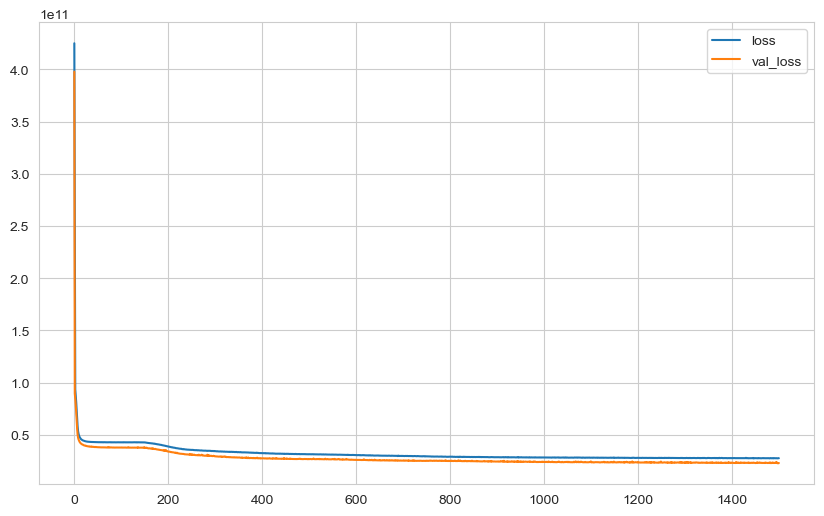

In [110]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [111]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [112]:
eval_metric(y_test, y_pred)

r2_score: 0.8214026706547425 
mae: 95091.80164207176 
mse: 22946142356.8886 
rmse: 151479.84142085904


In [113]:
model.save('model_kc_house.h5')  # creates a HDF5 file 'my_model.h5'

## Loading Model and Scaler

In [114]:
from tensorflow.keras.models import load_model

In [117]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house.pkl", "rb"))

## Prediction

In [118]:
single_house = df.drop('price', axis=1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000


In [119]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.57149751, 0.21760797, 0.15304348, 0.00573322,
        0.47826087]])

In [120]:
model_kc_house.predict(single_house)

1/1 [==============================] - 0s 386ms/step


array([[295666.84]], dtype=float32)

In [121]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [122]:
from sklearn.linear_model import LinearRegression 

In [123]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)

eval_metric(y_test, y_pred)

r2_score: 0.7054274599578876 
mae: 124778.36854918313 
mse: 37846609817.83076 
rmse: 194542.0515411276


### Random Forest

In [124]:
from sklearn.ensemble import RandomForestRegressor

In [125]:
rf_model = RandomForestRegressor(random_state=seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

eval_metric(y_test, y_pred)

r2_score: 0.8912532816836695 
mae: 64653.2709236993 
mse: 13971752480.727938 
rmse: 118202.16783429963
